In this post we'll have a look at what's know as **variational inference (VI)**, a family of _approximate_ Bayesian inference methods, and how to use it in Turing.jl as an alternative to other approaches such as MCMC. In particular, we will focus on one of the more standard VI methods called **Automatic Differentation Variational Inference (ADVI)**.

Here we will focus on how to use VI in Turing and not much on the theory underlying VI.
If you are interested in understanding the mathematics you can checkout [our write-up](../../docs/for-developers/variational_inference) or any other resource online (there a lot of great ones).

Using VI in Turing.jl is very straight forward.
If `model` denotes a definition of a `Turing.Model`, performing VI is as simple as

```julia
m = model(data...) # instantiate model on the data
q = vi(m, vi_alg)  # perform VI on `m` using the VI method `vi_alg`, which returns a `VariationalPosterior`
```

Thus it's no more work than standard MCMC sampling in Turing.

To get a bit more into what we can do with `vi`, we'll first have a look at a simple example and then we'll reproduce the [tutorial on Bayesian linear regression](../../tutorials/5-linearregression) using VI instead of MCMC. Finally we'll look at some of the different parameters of `vi` and how you for example can use your own custom variational family.

We first import the packages to be used:

In [1]:
using Random
using Turing
using Turing: Variational
using StatsPlots, Measures

Random.seed!(42);

## Simple example: Normal-Gamma conjugate model

The Normal-(Inverse)Gamma conjugate model is defined by the following generative process

\begin{align}
s &\sim \mathrm{InverseGamma}(2, 3) \\
m &\sim \mathcal{N}(0, s) \\
x_i &\overset{\text{i.i.d.}}{=} \mathcal{N}(m, s), \quad i = 1, \dots, n
\end{align}

Recall that *conjugate* refers to the fact that we can obtain a closed-form expression for the posterior. Of course one wouldn't use something like variational inference for a conjugate model, but it's useful as a simple demonstration as we can compare the result to the true posterior.

First we generate some synthetic data, define the `Turing.Model` and instantiate the model on the data:

In [2]:
# generate data
x = randn(2000);

In [3]:
@model function model(x)
    s ~ InverseGamma(2, 3)
    m ~ Normal(0.0, sqrt(s))
    for i in 1:length(x)
        x[i] ~ Normal(m, sqrt(s))
    end
end;

In [4]:
# Instantiate model
m = model(x);

Now we'll produce some samples from the posterior using a MCMC method, which in constrast to VI is guaranteed to converge to the *exact* posterior (as the number of samples go to infinity).

We'll produce 10 000 samples with 200 steps used for adaptation and a target acceptance rate of 0.65

If you don't understand what "adaptation" or "target acceptance rate" refers to, all you really need to know is that `NUTS` is known to be one of the most accurate and efficient samplers (when applicable) while requiring little to no hand-tuning to work well.

In [5]:
samples_nuts = sample(m, NUTS(), 10_000);

┌ Info: Found initial step size
└   ϵ = 0.025
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:03


Now let's try VI. The most important function you need to now about to do VI in Turing is `vi`:

In [6]:
@doc(Variational.vi)

```
vi(model, alg::VariationalInference)
vi(model, alg::VariationalInference, q::VariationalPosterior)
vi(model, alg::VariationalInference, getq::Function, θ::AbstractArray)
```

Constructs the variational posterior from the `model` and performs the optimization following the configuration of the given `VariationalInference` instance.

# Arguments

  * `model`: `Turing.Model` or `Function` z ↦ log p(x, z) where `x` denotes the observations
  * `alg`: the VI algorithm used
  * `q`: a `VariationalPosterior` for which it is assumed a specialized implementation of the variational objective used exists.
  * `getq`: function taking parameters `θ` as input and returns a `VariationalPosterior`
  * `θ`: only required if `getq` is used, in which case it is the initial parameters for the variational posterior


Additionally, you can pass

  - an initial variational posterior `q`, for which we assume there exists a implementation of `update(::typeof(q), θ::AbstractVector)` returning an updated posterior `q` with parameters `θ`.
  - a function mapping $\theta \mapsto q_{\theta}$ (denoted above `getq`) together with initial parameters `θ`. This provides more flexibility in the types of variational families that we can use, and can sometimes be slightly more convenient for quick and rough work.

By default, i.e. when calling `vi(m, advi)`, Turing use a *mean-field* approximation with a multivariate normal as the base-distribution. Mean-field refers to the fact that we assume all the latent variables to be *independent*. This the "standard" ADVI approach; see [Automatic Differentiation Variational Inference (2016)](https://arxiv.org/abs/1603.00788) for more. In Turing, one can obtain such a mean-field approximation by calling `Variational.meanfield(model)` for which there exists an internal implementation for `update`:

In [7]:
@doc(Variational.meanfield)

```
meanfield([rng, ]model::Model)
```

Creates a mean-field approximation with multivariate normal as underlying distribution.


Currently the only implementation of `VariationalInference` available is `ADVI`, which is very convenient and applicable as long as your `Model` is differentiable with respect to the *variational parameters*, that is, the parameters of your variational distribution, e.g. mean and variance in the mean-field approximation.

In [8]:
@doc(Variational.ADVI)

```julia
struct ADVI{AD} <: AdvancedVI.VariationalInference{AD}
```

Automatic Differentiation Variational Inference (ADVI) with automatic differentiation backend `AD`.

# Fields

  * `samples_per_step::Int64`: Number of samples used to estimate the ELBO in each optimization step.
  * `max_iters::Int64`: Maximum number of gradient steps.


To perform VI on the model `m` using 10 samples for gradient estimation and taking 1000 gradient steps is then as simple as:

In [9]:
# ADVI
advi = ADVI(10, 1000)
q = vi(m, advi);

┌ Info: [ADVI] Should only be seen once: optimizer created for θ
└   objectid(θ) = 0x00ff6c425716e79c
[ADVI] Optimizing... 100% Time: 0:00:13


Unfortunately, for such a small problem Turing's new `NUTS` sampler is *so* efficient now that it's not that much more efficient to use ADVI. So, so very unfortunate...

With that being said, this is not the case in general. For very complex models we'll later find that `ADVI` produces very reasonable results in a much shorter time than `NUTS`.

And one significant advantage of using `vi` is that we can sample from the resulting `q` with ease. In fact, the result of the `vi` call is a `TransformedDistribution` from Bijectors.jl, and it implements the Distributions.jl interface for a `Distribution`:

In [10]:
q isa MultivariateDistribution

true

This means that we can call `rand` to sample from the variational posterior `q`

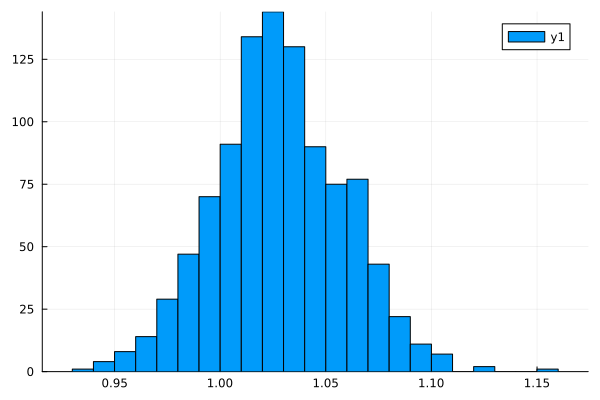

In [11]:
histogram(rand(q, 1_000)[1, :])

and `logpdf` to compute the log-probability

In [12]:
logpdf(q, rand(q))

4.494341898753301

Let's check the first and second moments of the data to see how our approximation compares to the point-estimates form the data:

In [13]:
var(x), mean(x)

(1.0149828942385808, -0.03802639687322374)

In [14]:
(mean(rand(q, 1000); dims=2)...,)

(1.0286841376581, -0.03086328260217505)

In [15]:
let
    v, m = (mean(rand(q, 1000); dims=2)...,)
    # On Turing version 0.14, this atol could be 0.01.
    @assert isapprox(v, 1.022; atol=0.1) "Mean of s (VI posterior, 1000 samples): $v"
    @assert isapprox(m, -0.027; atol=0.03) "Mean of m (VI posterior, 1000 samples): $m"
end

That's pretty close! But we're Bayesian so we're not interested in *just* matching the mean.
Let's instead look the actual density `q`.

For that we need samples:

In [16]:
samples = rand(q, 10000);
size(samples)

(2, 10000)

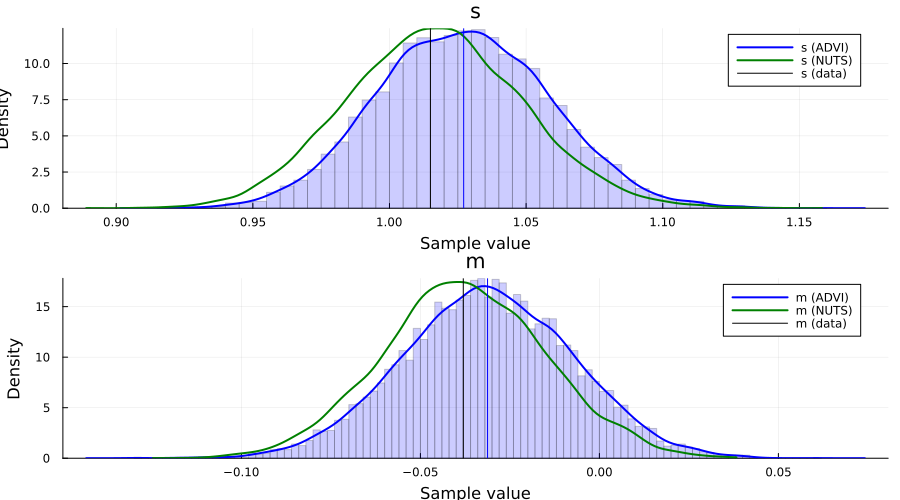

In [17]:
p1 = histogram(
    samples[1, :]; bins=100, normed=true, alpha=0.2, color=:blue, label="", ylabel="density"
)
density!(samples[1, :]; label="s (ADVI)", color=:blue, linewidth=2)
density!(samples_nuts, :s; label="s (NUTS)", color=:green, linewidth=2)
vline!([var(x)]; label="s (data)", color=:black)
vline!([mean(samples[1, :])]; color=:blue, label="")

p2 = histogram(
    samples[2, :]; bins=100, normed=true, alpha=0.2, color=:blue, label="", ylabel="density"
)
density!(samples[2, :]; label="m (ADVI)", color=:blue, linewidth=2)
density!(samples_nuts, :m; label="m (NUTS)", color=:green, linewidth=2)
vline!([mean(x)]; color=:black, label="m (data)")
vline!([mean(samples[2, :])]; color=:blue, label="")

plot(p1, p2; layout=(2, 1), size=(900, 500), legend=true)

For this particular `Model`, we can in fact obtain the posterior of the latent variables in closed form. This allows us to compare both `NUTS` and `ADVI` to the true posterior $p(s, m \mid x_1, \ldots, x_n)$.

*The code below is just work to get the marginals $p(s \mid x_1, \ldots, x_n)$ and $p(m \mid x_1, \ldots, x_n)$. Feel free to skip it.*

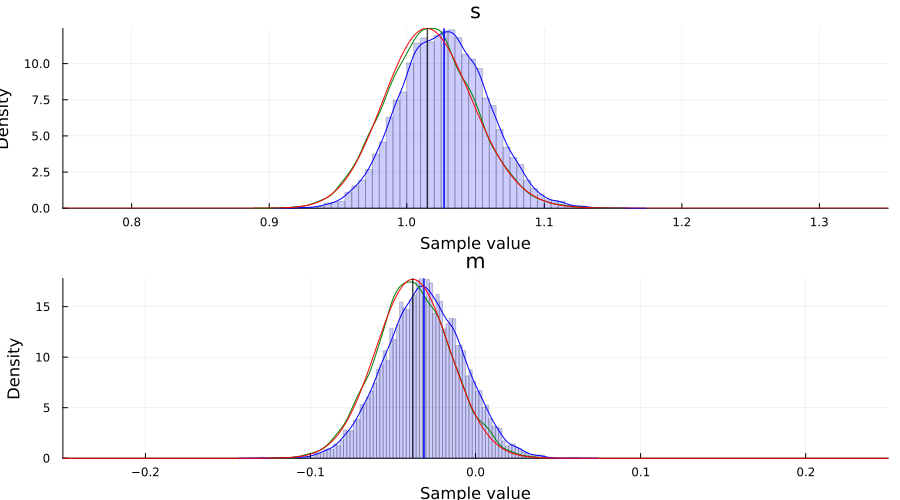

In [18]:
# closed form computation of the Normal-inverse-gamma posterior
# based on "Conjugate Bayesian analysis of the Gaussian distribution" by Murphy
function posterior(μ₀::Real, κ₀::Real, α₀::Real, β₀::Real, x::AbstractVector{<:Real})
    # Compute summary statistics
    n = length(x)
    x̄ = mean(x)
    sum_of_squares = sum(xi -> (xi - x̄)^2, x)

    # Compute parameters of the posterior
    κₙ = κ₀ + n
    μₙ = (κ₀ * μ₀ + n * x̄) / κₙ
    αₙ = α₀ + n / 2
    βₙ = β₀ + (sum_of_squares + n * κ₀ / κₙ * (x̄ - μ₀)^2) / 2

    return μₙ, κₙ, αₙ, βₙ
end
μₙ, κₙ, αₙ, βₙ = posterior(0.0, 1.0, 2.0, 3.0, x)

# marginal distribution of σ²
# cf. Eq. (90) in "Conjugate Bayesian analysis of the Gaussian distribution" by Murphy
p_σ² = InverseGamma(αₙ, βₙ)
p_σ²_pdf = z -> pdf(p_σ², z)

# marginal of μ
# Eq. (91) in "Conjugate Bayesian analysis of the Gaussian distribution" by Murphy
p_μ = μₙ + sqrt(βₙ / (αₙ * κₙ)) * TDist(2 * αₙ)
p_μ_pdf = z -> pdf(p_μ, z)

# posterior plots
p1 = plot()
histogram!(samples[1, :]; bins=100, normed=true, alpha=0.2, color=:blue, label="")
density!(samples[1, :]; label="s (ADVI)", color=:blue)
density!(samples_nuts, :s; label="s (NUTS)", color=:green)
vline!([mean(samples[1, :])]; linewidth=1.5, color=:blue, label="")
plot!(range(0.75, 1.35; length=1_001), p_σ²_pdf; label="s (posterior)", color=:red)
vline!([var(x)]; label="s (data)", linewidth=1.5, color=:black, alpha=0.7)
xlims!(0.75, 1.35)

p2 = plot()
histogram!(samples[2, :]; bins=100, normed=true, alpha=0.2, color=:blue, label="")
density!(samples[2, :]; label="m (ADVI)", color=:blue)
density!(samples_nuts, :m; label="m (NUTS)", color=:green)
vline!([mean(samples[2, :])]; linewidth=1.5, color=:blue, label="")
plot!(range(-0.25, 0.25; length=1_001), p_μ_pdf; label="m (posterior)", color=:red)
vline!([mean(x)]; label="m (data)", linewidth=1.5, color=:black, alpha=0.7)
xlims!(-0.25, 0.25)

plot(p1, p2; layout=(2, 1), size=(900, 500))

## Bayesian linear regression example using ADVI

This is simply a duplication of the tutorial [5. Linear regression](../regression/02_linear-regression) but now with the addition of an approximate posterior obtained using `ADVI`.

As we'll see, there is really no additional work required to apply variational inference to a more complex `Model`.

This section is basically copy-pasting the code from the [linear regression tutorial](../regression/02_linear-regression).

In [19]:
Random.seed!(1);

In [20]:
using FillArrays
using RDatasets

using LinearAlgebra

In [21]:
# Import the "Default" dataset.
data = RDatasets.dataset("datasets", "mtcars");

# Show the first six rows of the dataset.
first(data, 6)

Row,Model,MPG,Cyl,Disp,HP,DRat,WT,QSec,VS,AM,Gear,Carb
,String31,Float64,Int64,Float64,Int64,Float64,Float64,Float64,Int64,Int64,Int64,Int64
1,Mazda RX4,21.0,6,160.0,110,3.9,2.62,16.46,0,1,4,4
2,Mazda RX4 Wag,21.0,6,160.0,110,3.9,2.875,17.02,0,1,4,4
3,Datsun 710,22.8,4,108.0,93,3.85,2.32,18.61,1,1,4,1
4,Hornet 4 Drive,21.4,6,258.0,110,3.08,3.215,19.44,1,0,3,1
5,Hornet Sportabout,18.7,8,360.0,175,3.15,3.44,17.02,0,0,3,2
6,Valiant,18.1,6,225.0,105,2.76,3.46,20.22,1,0,3,1


In [22]:
# Function to split samples.
function split_data(df, at=0.70)
    r = size(df, 1)
    index = Int(round(r * at))
    train = df[1:index, :]
    test = df[(index + 1):end, :]
    return train, test
end

# A handy helper function to rescale our dataset.
function standardize(x)
    return (x .- mean(x; dims=1)) ./ std(x; dims=1)
end

function standardize(x, orig)
    return (x .- mean(orig; dims=1)) ./ std(orig; dims=1)
end

# Another helper function to unstandardize our datasets.
function unstandardize(x, orig)
    return x .* std(orig; dims=1) .+ mean(orig; dims=1)
end

function unstandardize(x, mean_train, std_train)
    return x .* std_train .+ mean_train
end

unstandardize (generic function with 2 methods)

In [23]:
# Remove the model column.
select!(data, Not(:Model))

# Split our dataset 70%/30% into training/test sets.
train, test = split_data(data, 0.7)
train_unstandardized = copy(train)

# Standardize both datasets.
std_train = standardize(Matrix(train))
std_test = standardize(Matrix(test), Matrix(train))

# Save dataframe versions of our dataset.
train_cut = DataFrame(std_train, names(data))
test_cut = DataFrame(std_test, names(data))

# Create our labels. These are the values we are trying to predict.
train_label = train_cut[:, :MPG]
test_label = test_cut[:, :MPG]

# Get the list of columns to keep.
remove_names = filter(x -> !in(x, ["MPG"]), names(data))

# Filter the test and train sets.
train = Matrix(train_cut[:, remove_names]);
test = Matrix(test_cut[:, remove_names]);

In [24]:
# Bayesian linear regression.
@model function linear_regression(x, y, n_obs, n_vars, ::Type{T}=Vector{Float64}) where {T}
    # Set variance prior.
    σ² ~ truncated(Normal(0, 100), 0, Inf)

    # Set intercept prior.
    intercept ~ Normal(0, 3)

    # Set the priors on our coefficients.
    coefficients ~ MvNormal(Zeros(n_vars), 10.0 * I)

    # Calculate all the mu terms.
    mu = intercept .+ x * coefficients
    return y ~ MvNormal(mu, σ² * I)
end;

In [25]:
n_obs, n_vars = size(train)
m = linear_regression(train, train_label, n_obs, n_vars);

## Performing VI

First we define the initial variational distribution, or, equivalently, the family of distributions to consider. We're going to use the same mean-field approximation as Turing will use by default when we call `vi(m, advi)`, which we obtain by calling `Variational.meanfield`. This returns a `TransformedDistribution` with a `TuringDiagMvNormal` as the underlying distribution and the transformation mapping from the reals to the domain of the latent variables.

In [26]:
q0 = Variational.meanfield(m)
typeof(q0)

MultivariateTransformed{TuringDiagMvNormal{Vector{Float64}, Vector{Float64}}, Stacked{Vector{Any}, Vector{UnitRange{Int64}}}} (alias for Bijectors.TransformedDistribution{DistributionsAD.TuringDiagMvNormal{Array{Float64, 1}, Array{Float64, 1}}, Stacked{Array{Any, 1}, Array{UnitRange{Int64}, 1}}, ArrayLikeVariate{1}})

In [27]:
advi = ADVI(10, 10_000)

ADVI{AdvancedVI.ForwardDiffAD{0}}(10, 10000)

Turing also provides a couple of different optimizers:

  - `TruncatedADAGrad` (default)
  - `DecayedADAGrad`
    as these are well-suited for problems with high-variance stochastic objectives, which is usually what the ELBO ends up being at different times in our optimization process.

With that being said, thanks to Requires.jl, if we add a `using Flux` prior to `using Turing` we can also make use of all the optimizers in `Flux`, e.g. `ADAM`, without any additional changes to your code! For example:

In [28]:
using Flux, Turing
using Turing.Variational

vi(m, advi; optimizer=Flux.ADAM())

[ADVI] Optimizing... 100% Time: 0:00:10


MultivariateTransformed{DistributionsAD.TuringDiagMvNormal{Vector{Float64}, Vector{Float64}}, Stacked{Vector{Any}, Vector{UnitRange{Int64}}}}(
dist: DistributionsAD.TuringDiagMvNormal{Vector{Float64}, Vector{Float64}}(
m: [0.978866126715568, 0.0006534027901744352, -0.17422912719207564, -0.25383439600549645, 0.21186263343991973, 0.1333749497461216, -0.6026685225789675, 0.2807792644256998, 0.12049478002451446, 0.1306981458139677, -0.1110938110419108, 0.2768220134928738]
σ: [1.2844429227327805, 0.25638250993778255, 0.33350725411344706, 0.6768261097336775, 0.40851336958067014, 0.47654131928903565, 0.4598336550616855, 0.6810966336273269, 0.2515843500746278, 0.19481928910012322, 0.36680397711824037, 0.3537760318841005]
)

transform: Stacked(Any[Inverse{Bijectors.TruncatedBijector{Float64, Float64}}(Bijectors.TruncatedBijector{Float64, Float64}(0.0, Inf)), identity, Turing.Variational.Vec{1, typeof(identity)}(identity, (10,))], UnitRange{Int64}[1:1, 2:2, 3:12], UnitRange{Int64}[1:1, 2:2, 3:12

just works.

For this problem we'll use the `DecayedADAGrad` from Turing:

In [29]:
opt = Variational.DecayedADAGrad(1e-2, 1.1, 0.9)

DecayedADAGrad(0.01, 1.1, 0.9, IdDict{Any, Any}())

In [30]:
q = vi(m, advi, q0; optimizer=opt)
typeof(q)

[ADVI] Optimizing... 100% Time: 0:00:07


MultivariateTransformed{TuringDiagMvNormal{Vector{Float64}, Vector{Float64}}, Stacked{Vector{Any}, Vector{UnitRange{Int64}}}} (alias for Bijectors.TransformedDistribution{DistributionsAD.TuringDiagMvNormal{Array{Float64, 1}, Array{Float64, 1}}, Stacked{Array{Any, 1}, Array{UnitRange{Int64}, 1}}, ArrayLikeVariate{1}})

*Note: as mentioned before, we internally define a `update(q::TransformedDistribution{<:TuringDiagMvNormal}, θ::AbstractVector)` method which takes in the current variational approximation `q` together with new parameters `z` and returns the new variational approximation. This is required so that we can actually update the `Distribution` object after each optimization step.*

*Alternatively, we can instead provide the mapping $\theta \mapsto q_{\theta}$ directly together with initial parameters using the signature `vi(m, advi, getq, θ_init)` as mentioned earlier. We'll see an explicit example of this later on!*

To compute statistics for our approximation we need samples:

In [31]:
z = rand(q, 10_000);

Now we can for example look at the average

In [32]:
avg = vec(mean(z; dims=2))

12-element Vector{Float64}:
  0.2221086760448064
  0.011331482863682572
  0.36647799487157434
 -0.11257135883855413
 -0.0866297901923446
  0.6198315638486509
 -0.00018712102137407672
  0.08749207018347806
 -0.06394235836374411
  0.12419182359484805
  0.19426475576702862
 -0.6194743465983262

The vector has the same ordering as the model, e.g. in this case `σ²` has index `1`, `intercept` has index `2` and `coefficients` has indices `3:12`. If  you forget or you might want to do something programmatically with the result, you can obtain the `sym → indices` mapping as follows:

In [33]:
_, sym2range = bijector(m, Val(true));
sym2range

(intercept = UnitRange{Int64}[2:2], σ² = UnitRange{Int64}[1:1], coefficients = UnitRange{Int64}[3:12])

For example, we can check the sample distribution and mean value of `σ²`:

In [34]:
histogram(z[1, :])
avg[union(sym2range[:σ²]...)]

1-element Vector{Float64}:
 0.2221086760448064

In [35]:
avg[union(sym2range[:intercept]...)]

1-element Vector{Float64}:
 0.011331482863682572

In [36]:
avg[union(sym2range[:coefficients]...)]

10-element Vector{Float64}:
  0.36647799487157434
 -0.11257135883855413
 -0.0866297901923446
  0.6198315638486509
 -0.00018712102137407672
  0.08749207018347806
 -0.06394235836374411
  0.12419182359484805
  0.19426475576702862
 -0.6194743465983262

*Note: as you can see, this is slightly awkward to work with at the moment. We'll soon add a better way of dealing with this.*

With a bit of work (this will be much easier in the future), we can also visualize the approximate marginals of the different variables, similar to `plot(chain)`:

In [37]:
function plot_variational_marginals(z, sym2range)
    ps = []

    for (i, sym) in enumerate(keys(sym2range))
        indices = union(sym2range[sym]...)  # <= array of ranges
        if sum(length.(indices)) > 1
            offset = 1
            for r in indices
                p = density(
                    z[r, :];
                    title="$(sym)[$offset]",
                    titlefontsize=10,
                    label="",
                    ylabel="Density",
                    margin=1.5mm,
                )
                push!(ps, p)
                offset += 1
            end
        else
            p = density(
                z[first(indices), :];
                title="$(sym)",
                titlefontsize=10,
                label="",
                ylabel="Density",
                margin=1.5mm,
            )
            push!(ps, p)
        end
    end

    return plot(ps...; layout=(length(ps), 1), size=(500, 2000), margin=4.0mm)
end

plot_variational_marginals (generic function with 1 method)

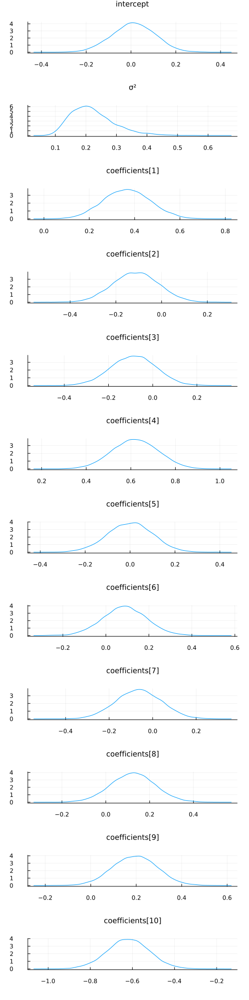

In [38]:
plot_variational_marginals(z, sym2range)

And let's compare this to using the `NUTS` sampler:

In [39]:
chain = sample(m, NUTS(), 10_000);

┌ Info: Found initial step size
└   ϵ = 0.025
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:08


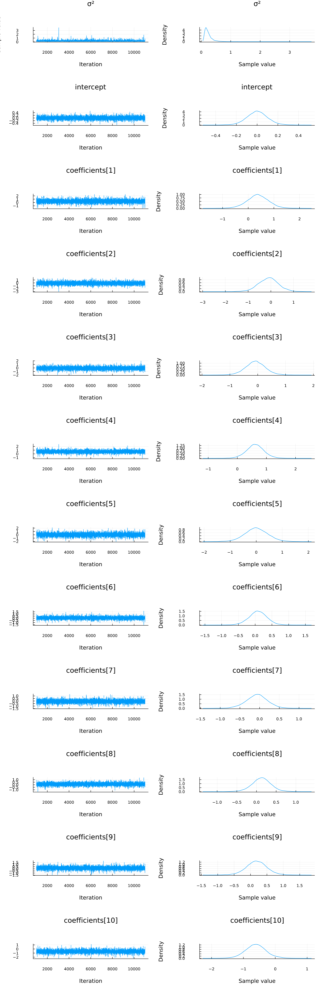

In [40]:
plot(chain; margin=12.00mm)

In [41]:
vi_mean = vec(mean(z; dims=2))[[
    union(sym2range[:σ²]...)...,
    union(sym2range[:intercept]...)...,
    union(sym2range[:coefficients]...)...,
]]

12-element Vector{Float64}:
  0.2221086760448064
  0.011331482863682572
  0.36647799487157434
 -0.11257135883855413
 -0.0866297901923446
  0.6198315638486509
 -0.00018712102137407672
  0.08749207018347806
 -0.06394235836374411
  0.12419182359484805
  0.19426475576702862
 -0.6194743465983262

In [42]:
mcmc_mean = mean(chain, names(chain, :parameters))[:, 2]

12-element Vector{Float64}:
  0.24093542871526866
  0.0008264421294045816
  0.372151790733897
 -0.10597185411167794
 -0.08386504527918119
  0.6118534072390985
  0.005177392165379376
  0.08003617750516644
 -0.06941792020540849
  0.12547227209446218
  0.18324449391093772
 -0.6144122806430592

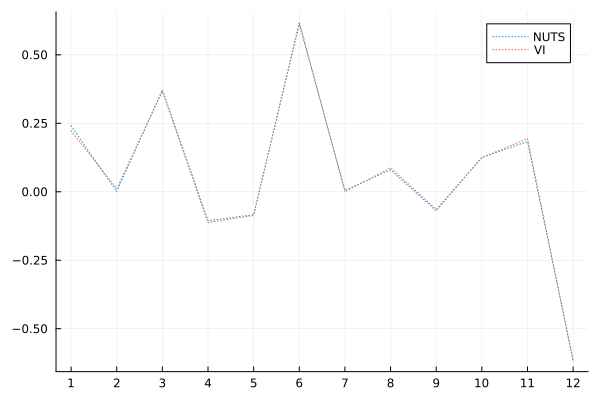

In [43]:
plot(mcmc_mean; xticks=1:1:length(mcmc_mean), linestyle=:dot, label="NUTS")
plot!(vi_mean; linestyle=:dot, label="VI")

One thing we can look at is simply the squared error between the means:

In [44]:
sum(abs2, mcmc_mean .- vi_mean)

0.0008749030627080679

That looks pretty good! But let's see how the predictive distributions looks for the two.

## Prediction

Similarily to the linear regression tutorial, we're going to compare to multivariate ordinary linear regression using the `GLM` package:

In [45]:
# Import the GLM package.
using GLM

# Perform multivariate OLS.
ols = lm(
    @formula(MPG ~ Cyl + Disp + HP + DRat + WT + QSec + VS + AM + Gear + Carb), train_cut
)

# Store our predictions in the original dataframe.
train_cut.OLSPrediction = unstandardize(GLM.predict(ols), train_unstandardized.MPG)
test_cut.OLSPrediction = unstandardize(GLM.predict(ols, test_cut), train_unstandardized.MPG);

In [46]:
# Make a prediction given an input vector, using mean parameter values from a chain.
function prediction_chain(chain, x)
    p = get_params(chain)
    α = mean(p.intercept)
    β = collect(mean.(p.coefficients))
    return α .+ x * β
end

prediction_chain (generic function with 1 method)

In [47]:
# Make a prediction using samples from the variational posterior given an input vector.
function prediction(samples::AbstractVector, sym2ranges, x)
    α = mean(samples[union(sym2ranges[:intercept]...)])
    β = vec(mean(samples[union(sym2ranges[:coefficients]...)]; dims=2))
    return α .+ x * β
end

function prediction(samples::AbstractMatrix, sym2ranges, x)
    α = mean(samples[union(sym2ranges[:intercept]...), :])
    β = vec(mean(samples[union(sym2ranges[:coefficients]...), :]; dims=2))
    return α .+ x * β
end

prediction (generic function with 2 methods)

In [48]:
# Unstandardize the dependent variable.
train_cut.MPG = unstandardize(train_cut.MPG, train_unstandardized.MPG)
test_cut.MPG = unstandardize(test_cut.MPG, train_unstandardized.MPG);

In [49]:
# Show the first side rows of the modified dataframe.
first(test_cut, 6)

Row,MPG,Cyl,Disp,HP,DRat,WT,QSec,VS,AM,Gear,Carb,OLSPrediction
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,15.2,1.04746,0.565102,0.258882,-0.652405,0.0714991,-0.716725,-0.977008,-0.598293,-0.891883,-0.469126,19.8583
2,13.3,1.04746,0.929057,1.90345,0.380435,0.465717,-1.90403,-0.977008,-0.598293,-0.891883,1.11869,16.0462
3,19.2,1.04746,1.32466,0.691663,-0.777058,0.470584,-0.873777,-0.977008,-0.598293,-0.891883,-0.469126,18.5746
4,27.3,-1.25696,-1.21511,-1.19526,1.0037,-1.38857,0.288403,0.977008,1.59545,1.07026,-1.26303,29.3233
5,26.0,-1.25696,-0.888346,-0.762482,1.62697,-1.18903,-1.09365,-0.977008,1.59545,3.0324,-0.469126,30.7731
6,30.4,-1.25696,-1.08773,-0.381634,0.451665,-1.79933,-0.968007,0.977008,1.59545,3.0324,-0.469126,25.2892


In [50]:
z = rand(q, 10_000);

In [51]:
# Calculate the predictions for the training and testing sets using the samples `z` from variational posterior
train_cut.VIPredictions = unstandardize(
    prediction(z, sym2range, train), train_unstandardized.MPG
)
test_cut.VIPredictions = unstandardize(
    prediction(z, sym2range, test), train_unstandardized.MPG
)

train_cut.BayesPredictions = unstandardize(
    prediction_chain(chain, train), train_unstandardized.MPG
)
test_cut.BayesPredictions = unstandardize(
    prediction_chain(chain, test), train_unstandardized.MPG
);

In [52]:
vi_loss1 = mean((train_cut.VIPredictions - train_cut.MPG) .^ 2)
bayes_loss1 = mean((train_cut.BayesPredictions - train_cut.MPG) .^ 2)
ols_loss1 = mean((train_cut.OLSPrediction - train_cut.MPG) .^ 2)

vi_loss2 = mean((test_cut.VIPredictions - test_cut.MPG) .^ 2)
bayes_loss2 = mean((test_cut.BayesPredictions - test_cut.MPG) .^ 2)
ols_loss2 = mean((test_cut.OLSPrediction - test_cut.MPG) .^ 2)

println("Training set:
    VI loss: $vi_loss1
    Bayes loss: $bayes_loss1
    OLS loss: $ols_loss1
Test set: 
    VI loss: $vi_loss2
    Bayes loss: $bayes_loss2
    OLS loss: $ols_loss2")

Training set:
    VI loss: 3.145531065866142
    Bayes loss: 3.072178941953359
    OLS loss: 3.0709261248930093
Test set: 
    VI loss: 26.643722852387405
    Bayes loss: 26.349405100103883
    OLS loss: 27.09481307076057


Interestingly the squared difference between true- and mean-prediction on the test-set is actually *better* for the mean-field variational posterior than for the "true" posterior obtained by MCMC sampling using `NUTS`. But, as Bayesians, we know that the mean doesn't tell the entire story. One quick check is to look at the mean predictions ± standard deviation of the two different approaches:

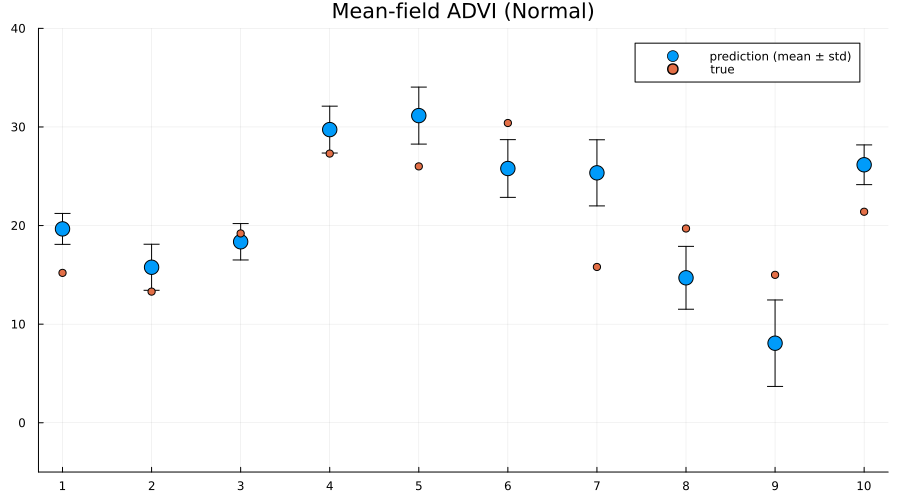

In [53]:
z = rand(q, 1000);
preds = mapreduce(hcat, eachcol(z)) do zi
    return unstandardize(prediction(zi, sym2range, test), train_unstandardized.MPG)
end

scatter(
    1:size(test, 1),
    mean(preds; dims=2);
    yerr=std(preds; dims=2),
    label="prediction (mean ± std)",
    size=(900, 500),
    markersize=8,
)
scatter!(1:size(test, 1), unstandardize(test_label, train_unstandardized.MPG); label="true")
xaxis!(1:size(test, 1))
ylims!(-5, 40)
title!("Mean-field ADVI (Normal)")

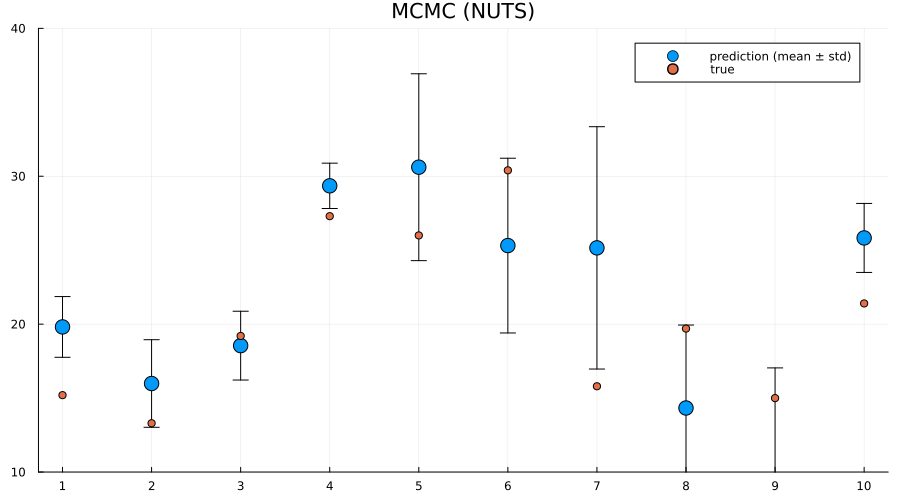

In [54]:
preds = mapreduce(hcat, 1:5:size(chain, 1)) do i
    return unstandardize(prediction_chain(chain[i], test), train_unstandardized.MPG)
end

scatter(
    1:size(test, 1),
    mean(preds; dims=2);
    yerr=std(preds; dims=2),
    label="prediction (mean ± std)",
    size=(900, 500),
    markersize=8,
)
scatter!(1:size(test, 1), unstandardize(test_label, train_unstandardized.MPG); label="true")
xaxis!(1:size(test, 1))
ylims!(10, 40)
title!("MCMC (NUTS)")

Indeed we see that the MCMC approach generally provides better uncertainty estimates than the mean-field ADVI approach! Good. So all the work we've done to make MCMC fast isn't for nothing.

## Alternative: provide parameter-to-distribution instead of $q$ with `update` implemented

As mentioned earlier, it's also possible to just provide the mapping $\theta \mapsto q_{\theta}$ rather than the variational family / initial variational posterior `q`, i.e. use the interface `vi(m, advi, getq, θ_init)` where `getq` is the mapping $\theta \mapsto q_{\theta}$

In this section we're going to construct a mean-field approximation to the model by hand using a composition of`Shift` and `Scale` from Bijectors.jl togheter with a standard multivariate Gaussian as the base distribution.

In [55]:
using Bijectors

In [56]:
using Bijectors: Scale, Shift

In [57]:
d = length(q)
base_dist = Turing.DistributionsAD.TuringDiagMvNormal(zeros(d), ones(d))

DistributionsAD.TuringDiagMvNormal{Vector{Float64}, Vector{Float64}}(
m: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
σ: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
)


`bijector(model::Turing.Model)` is defined by Turing, and will return a `bijector` which takes you from the space of the latent variables to the real space. In this particular case, this is a mapping `((0, ∞) × ℝ × ℝ¹⁰) → ℝ¹²`. We're interested in using a normal distribution as a base-distribution and transform samples to the latent space, thus we need the inverse mapping from the reals to the latent space:

In [58]:
to_constrained = inverse(bijector(m));

In [59]:
function getq(θ)
    d = length(θ) ÷ 2
    A = @inbounds θ[1:d]
    b = @inbounds θ[(d + 1):(2 * d)]

    b = to_constrained ∘ Shift(b) ∘ Scale(exp.(A))

    return transformed(base_dist, b)
end

getq (generic function with 1 method)

In [60]:
q_mf_normal = vi(m, advi, getq, randn(2 * d));

┌ Info: [ADVI] Should only be seen once: optimizer created for θ
└   objectid(θ) = 0x00bfaadaf7804f4b
[ADVI] Optimizing... 100% Time: 0:00:12


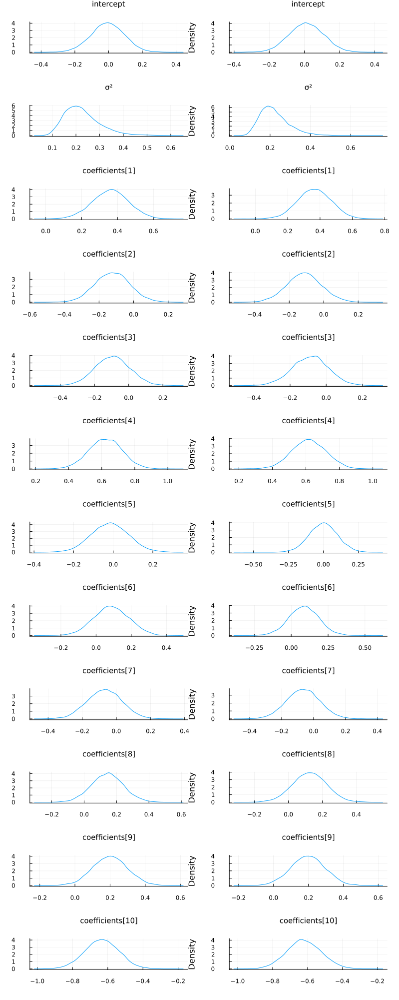

In [61]:
p1 = plot_variational_marginals(rand(q_mf_normal, 10_000), sym2range) # MvDiagNormal + Affine transformation + to_constrained
p2 = plot_variational_marginals(rand(q, 10_000), sym2range)  # Turing.meanfield(m)

plot(p1, p2; layout=(1, 2), size=(800, 2000))

As expected, the fits look pretty much identical.

But using this interface it becomes trivial to go beyond the mean-field assumption we made for the variational posterior, as we'll see in the next section.

### Relaxing the mean-field assumption

Here we'll instead consider the variational family to be a full non-diagonal multivariate Gaussian. As in the previous section we'll implement this by transforming a standard multivariate Gaussian using `Scale` and `Shift`, but now `Scale` will instead be using a lower-triangular matrix (representing the Cholesky of the covariance matrix of a multivariate normal) in contrast to the diagonal matrix we used in for the mean-field approximate posterior.

In [62]:
# Using `ComponentArrays.jl` together with `UnPack.jl` makes our lives much easier.
using ComponentArrays, UnPack

In [63]:
proto_arr = ComponentArray(; L=zeros(d, d), b=zeros(d))
proto_axes = getaxes(proto_arr)
num_params = length(proto_arr)

function getq(θ)
    L, b = begin
        @unpack L, b = ComponentArray(θ, proto_axes)
        LowerTriangular(L), b
    end
    # For this to represent a covariance matrix we need to ensure that the diagonal is positive.
    # We can enforce this by zeroing out the diagonal and then adding back the diagonal exponentiated.
    D = Diagonal(diag(L))
    A = L - D + exp(D) # exp for Diagonal is the same as exponentiating only the diagonal entries

    b = to_constrained ∘ Shift(b) ∘ Scale(A)

    return transformed(base_dist, b)
end

getq (generic function with 1 method)

In [64]:
advi = ADVI(10, 20_000)

ADVI{AdvancedVI.ForwardDiffAD{0}}(10, 20000)

In [65]:
q_full_normal = vi(
    m, advi, getq, randn(num_params); optimizer=Variational.DecayedADAGrad(1e-2)
);

[ADVI] Optimizing... 100% Time: 0:02:10


Let's have a look at the learned covariance matrix:

In [66]:
A = q_full_normal.transform.inner.a

12×12 LowerTriangular{Float64, Matrix{Float64}}:
  0.316938       ⋅             ⋅          …    ⋅           ⋅          ⋅ 
 -0.000263689   0.0964761      ⋅               ⋅           ⋅          ⋅ 
 -0.0116467     0.00278648    0.42264          ⋅           ⋅          ⋅ 
  0.0025481    -0.00863937   -0.0555558        ⋅           ⋅          ⋅ 
  0.00464017    0.00408951   -0.048293         ⋅           ⋅          ⋅ 
 -0.00362152    0.0122621     0.120654    …    ⋅           ⋅          ⋅ 
 -0.00357323   -0.00625398    0.00938339       ⋅           ⋅          ⋅ 
 -0.00291973    0.00036296    0.107465         ⋅           ⋅          ⋅ 
  0.00903545    0.00598447    0.0875523        ⋅           ⋅          ⋅ 
  0.010489      0.00793991    0.0592278       0.142096     ⋅          ⋅ 
  0.00224518   -0.00813673    0.0391846   …  -0.0936448   0.0975044   ⋅ 
  0.0019786     0.000420473  -0.0684804       0.0102803  -0.0077316  0.098808

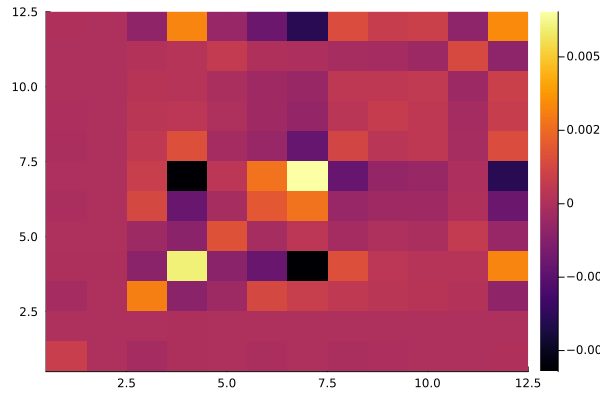

In [67]:
heatmap(cov(A * A'))

In [68]:
zs = rand(q_full_normal, 10_000);

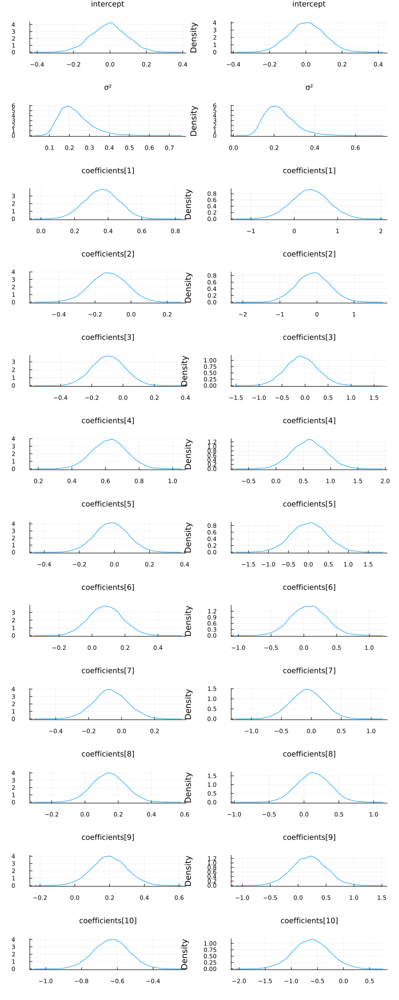

In [69]:
p1 = plot_variational_marginals(rand(q_mf_normal, 10_000), sym2range)
p2 = plot_variational_marginals(rand(q_full_normal, 10_000), sym2range)

plot(p1, p2; layout=(1, 2), size=(800, 2000))

So it seems like the "full" ADVI approach, i.e. no mean-field assumption, obtain the same modes as the mean-field approach but with greater uncertainty for some of the `coefficients`. This

In [70]:
# Unfortunately, it seems like this has quite a high variance which is likely to be due to numerical instability, 
# so we consider a larger number of samples. If we get a couple of outliers due to numerical issues, 
# these kind affect the mean prediction greatly.
z = rand(q_full_normal, 10_000);

In [71]:
train_cut.VIFullPredictions = unstandardize(
    prediction(z, sym2range, train), train_unstandardized.MPG
)
test_cut.VIFullPredictions = unstandardize(
    prediction(z, sym2range, test), train_unstandardized.MPG
);

In [72]:
vi_loss1 = mean((train_cut.VIPredictions - train_cut.MPG) .^ 2)
vifull_loss1 = mean((train_cut.VIFullPredictions - train_cut.MPG) .^ 2)
bayes_loss1 = mean((train_cut.BayesPredictions - train_cut.MPG) .^ 2)
ols_loss1 = mean((train_cut.OLSPrediction - train_cut.MPG) .^ 2)

vi_loss2 = mean((test_cut.VIPredictions - test_cut.MPG) .^ 2)
vifull_loss2 = mean((test_cut.VIFullPredictions - test_cut.MPG) .^ 2)
bayes_loss2 = mean((test_cut.BayesPredictions - test_cut.MPG) .^ 2)
ols_loss2 = mean((test_cut.OLSPrediction - test_cut.MPG) .^ 2)

println("Training set:
    VI loss: $vi_loss1
    VI Full loss: $vifull_loss1
    Bayes loss: $bayes_loss1
    OLS loss: $ols_loss1
Test set: 
    VI loss: $vi_loss2
    VI Full loss: $vifull_loss2
    Bayes loss: $bayes_loss2
    OLS loss: $ols_loss2")

Training set:
    VI loss: 3.145531065866142
    VI Full loss: 3.077764230499406
    Bayes loss: 3.072178941953359
    OLS loss: 3.0709261248930093
Test set: 
    VI loss: 26.643722852387405
    VI Full loss: 25.94790749263469
    Bayes loss: 26.349405100103883
    OLS loss: 27.09481307076057


In [73]:
# Verify the loss on the test set.
@assert vi_loss2 < 27.0 "VI loss on the test set: $(vi_loss2)"
@assert bayes_loss2 < 27.0 "Bayes loss on the test set: $(bayes_loss2)"

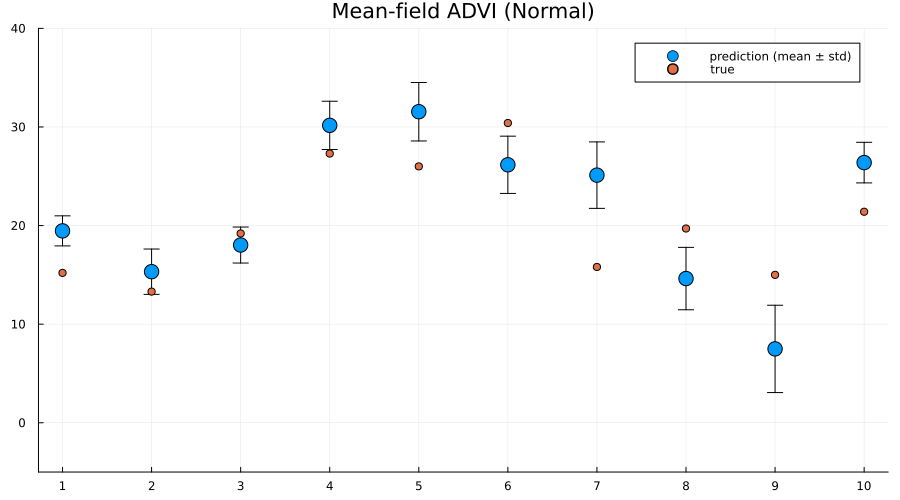

In [74]:
z = rand(q_mf_normal, 1000);
preds = mapreduce(hcat, eachcol(z)) do zi
    return unstandardize(prediction(zi, sym2range, test), train_unstandardized.MPG)
end

p1 = scatter(
    1:size(test, 1),
    mean(preds; dims=2);
    yerr=std(preds; dims=2),
    label="prediction (mean ± std)",
    size=(900, 500),
    markersize=8,
)
scatter!(1:size(test, 1), unstandardize(test_label, train_unstandardized.MPG); label="true")
xaxis!(1:size(test, 1))
ylims!(-5, 40)
title!("Mean-field ADVI (Normal)")

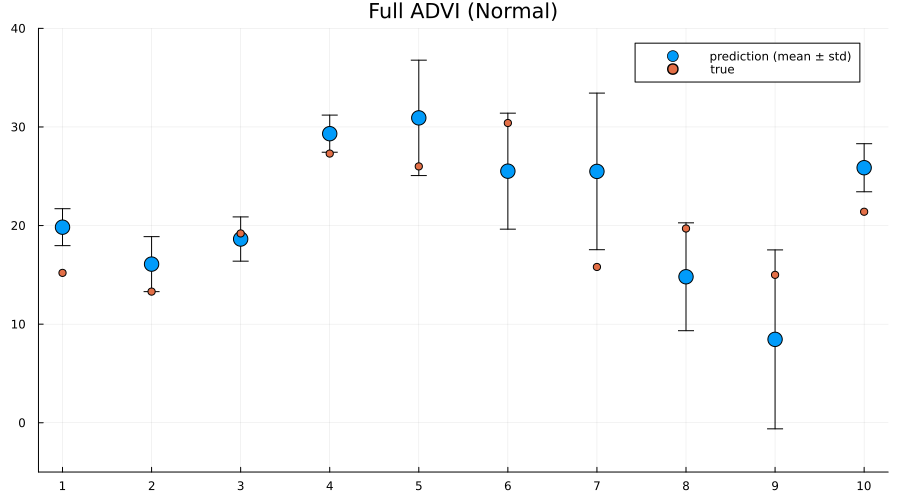

In [75]:
z = rand(q_full_normal, 1000);
preds = mapreduce(hcat, eachcol(z)) do zi
    return unstandardize(prediction(zi, sym2range, test), train_unstandardized.MPG)
end

p2 = scatter(
    1:size(test, 1),
    mean(preds; dims=2);
    yerr=std(preds; dims=2),
    label="prediction (mean ± std)",
    size=(900, 500),
    markersize=8,
)
scatter!(1:size(test, 1), unstandardize(test_label, train_unstandardized.MPG); label="true")
xaxis!(1:size(test, 1))
ylims!(-5, 40)
title!("Full ADVI (Normal)")

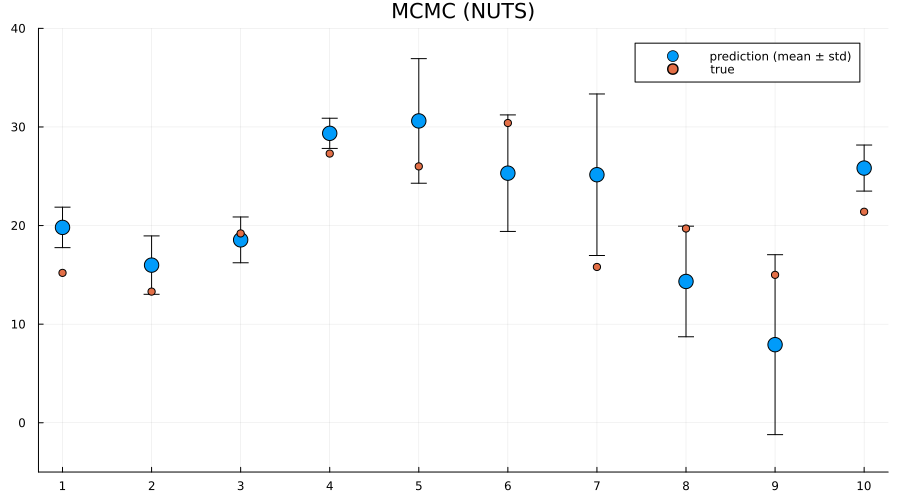

In [76]:
preds = mapreduce(hcat, 1:5:size(chain, 1)) do i
    return unstandardize(prediction_chain(chain[i], test), train_unstandardized.MPG)
end

p3 = scatter(
    1:size(test, 1),
    mean(preds; dims=2);
    yerr=std(preds; dims=2),
    label="prediction (mean ± std)",
    size=(900, 500),
    markersize=8,
)
scatter!(1:size(test, 1), unstandardize(test_label, train_unstandardized.MPG); label="true")
xaxis!(1:size(test, 1))
ylims!(-5, 40)
title!("MCMC (NUTS)")

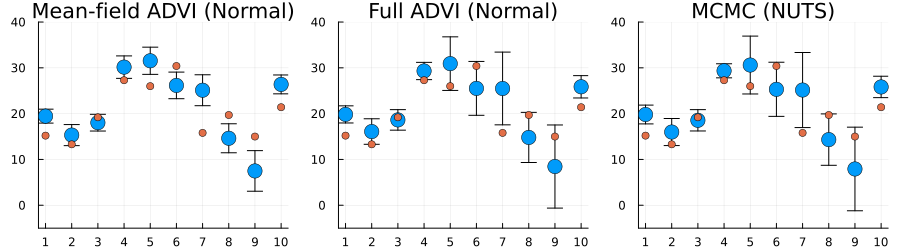

In [77]:
plot(p1, p2, p3; layout=(1, 3), size=(900, 250), label="")

Here we actually see that indeed both the full ADVI and the MCMC approaches does a much better job of quantifying the uncertainty of predictions for never-before-seen samples, with full ADVI seemingly *underestimating* the variance slightly compared to MCMC.

So now you know how to do perform VI on your Turing.jl model! Great isn't it?

In [78]:
if isdefined(Main, :TuringTutorials)
    Main.TuringTutorials.tutorial_footer(WEAVE_ARGS[:folder], WEAVE_ARGS[:file])
end

In [79]:
let
#     using LinearAlgebra
    function cov_rand()
        # 임의의 4x4 행렬 생성
        random_matrix = rand(4, 4)

        # 행렬을 대칭으로 만듭니다.
        symmetric_matrix = (random_matrix + random_matrix') / 2

        # 대각선 요소를 양수로 만들어 유효한 공분산 행렬을 생성합니다.
        # 이를 위해 대각행렬 D를 만들고, 이를 원래 행렬에 더합니다.
        D = Diagonal([1.0, 1.0, 1.0, 1.0])
        covariance_matrix = symmetric_matrix + D
    end
    L_org = cov_rand() 
    L = LowerTriangular(L_org)    
    D = Diagonal(diag(L))
    A = L - D + exp(D)
    A |> display
    
    AA = L_org - D + exp(D)
    AA |> display
    
    x = [0.01,0.005,0.00001,0.1]
    Scale(A)(x) |> display
    AA*x |> display

    A |> display
    A*x |> display
    
    b  = 2
    
    "A*x + b" |> display
    A*x .+ b |> display
    
    "(Shift(b) ∘ Scale(A))(x)" |> display
    (Shift(b) ∘ Scale(A))(x) |> display
    
    inv = inverse(bijector(LogitNormal(0,1)))   
    
    "inv(A*x + b)" |> display
    inv(A*x .+ b) |> display
    
    "(inv ∘ Shift(b) ∘ Scale(A))(x)" |> display
    (inv ∘ Shift(b) ∘ Scale(A))(x) |> display
end

4×4 LowerTriangular{Float64, Matrix{Float64}}:
 5.39808    ⋅         ⋅         ⋅ 
 0.410891  2.83225    ⋅         ⋅ 
 0.903514  0.505825  3.33489    ⋅ 
 0.507864  0.649225  0.591234  4.61328

4×4 Matrix{Float64}:
 5.39808   0.410891  0.903514  0.507864
 0.410891  2.83225   0.505825  0.649225
 0.903514  0.505825  3.33489   0.591234
 0.507864  0.649225  0.591234  4.61328

4-element Vector{Float64}:
 0.05398077049959347
 0.01827017315769853
 0.011597615815893764
 0.46965854416541003

4-element Vector{Float64}:
 0.1068306689609134
 0.0831976862362675
 0.07072104247503784
 0.46965854416541003

4×4 LowerTriangular{Float64, Matrix{Float64}}:
 5.39808    ⋅         ⋅         ⋅ 
 0.410891  2.83225    ⋅         ⋅ 
 0.903514  0.505825  3.33489    ⋅ 
 0.507864  0.649225  0.591234  4.61328

4-element Vector{Float64}:
 0.05398077049959347
 0.01827017315769853
 0.011597615815893764
 0.46965854416541003

"A*x + b"

4-element Vector{Float64}:
 2.0539807704995936
 2.0182701731576986
 2.011597615815894
 2.46965854416541

"(Shift(b) ∘ Scale(A))(x)"

4-element Vector{Float64}:
 2.0539807704995936
 2.0182701731576986
 2.011597615815894
 2.46965854416541

"inv(A*x + b)"

4-element Vector{Float64}:
 0.8863492358661665
 0.8827020228380809
 0.8820093856952336
 0.9219872085851012

"(inv ∘ Shift(b) ∘ Scale(A))(x)"

4-element Vector{Float64}:
 0.8863492358661665
 0.8827020228380809
 0.8820093856952336
 0.9219872085851012

In [80]:
let
    a = [0.2 0.3 -0.3;0.2 0.3 -0.3; 0.2 0.3 -0.3]
    cov(a)
end

3×3 Matrix{Float64}:
  1.15556e-33  -0.0  -0.0
 -0.0           0.0   0.0
 -0.0           0.0   0.0

In [81]:
let
    cv(a,b) = sum( (a .- mean(a) ).* (b .- mean(b))) / (length(a) - 1)
    a = [1,2,3,4]
    b =[2,3,1,3]
    data = hcat(a, b)
    cov_matrix = cov(data)
    cov_matrix |> display
    [cov(a,a) cov(a,b); cov(b,a) cov(b,b)]
    μ_a = mean(a)
    μ_b = mean(b)    
    cov(b,b) |> display
    cv(a,b) |> display
    
end

2×2 Matrix{Float64}:
 1.66667   0.166667
 0.166667  0.916667

0.9166666666666666

0.16666666666666666

In [82]:
length(q)

12

In [83]:
Bijectors.transform(exp,1)

2.718281828459045

Bijectors.Logit{Float64}(0.0, 1.0)

Inverse{Bijectors.Logit{Float64}}(Bijectors.Logit{Float64}(0.0, 1.0))

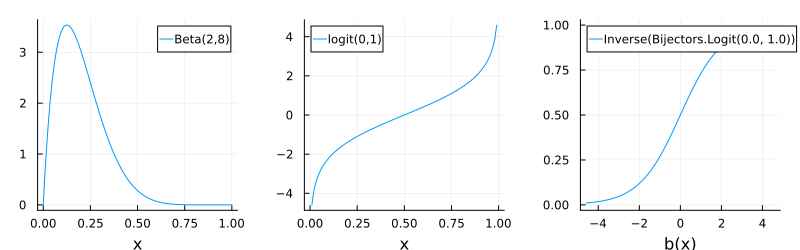

UnivariateTransformed{Normal{Float64}, Inverse{Bijectors.Logit{Float64}}}(
dist: Normal{Float64}(μ=0.0, σ=1.0)
transform: Inverse{Bijectors.Logit{Float64}}(Bijectors.Logit{Float64}(0.0, 1.0))
)


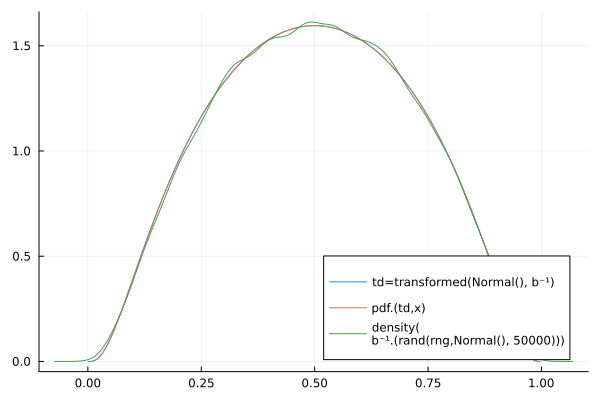

In [84]:
using StableRNGs:StableRNG
let
    rng = StableRNG(42)
    # 현실공간(파라미터 범위 제한)
    dist = Beta(2,8) # (0, 1)
    p1 = plot(dist, label="Beta(2,8)", xlabel="x")
    
    # 잠재공간(파라미터 범위 무제한), 미분등 계산 편리
    b = bijector(dist)  # (0, 1) → ℝ
    b |> display
    x = 0:0.01:1
    b_v = b(x)
    p2 = plot(x,b_v, label="logit(0,1)", xlabel="x")
    
    # 잠재공간을 현실공간으로 매핑
    b⁻¹ = inverse(b)   # ℝ → (0, 1)
    b⁻¹ |> display
    b⁻¹_v = b⁻¹(b_v)    
    p3 = plot(b_v,b⁻¹_v, label="Inverse(Bijectors.Logit(0.0, 1.0))",
        xlabel="b(x)")
    Inverse(Bijectors.Logit(0.0, 1.0))    
    plot(p1,p2,p3,layout=(1,3), size=(800,250), margin=3mm) |> display
    
    # transformed : Normal() => b⁻¹ , Normal 분포를 다른 분포로 변환
    
    td = transformed(Normal(), b⁻¹)  # x ∼ 𝓝(0, 1) then b⁻¹(x) ∈ (0, 1)
    td |> display

    td_pdf_v =pdf.(td,x)
    #td_f = b⁻¹∘ pdf.(Normal(),x) 
    
    plot(td, label="td=transformed(Normal(), b⁻¹)", legend=:bottomright)
    plot!(x, td_pdf_v, label="pdf.(td,x)")    
    # x ∼ 𝓝(0, 1) then b⁻¹(x) ∈ (0, 1)
    density!(b⁻¹.(rand(rng,Normal(), 50000))    ,label="density(\nb⁻¹.(rand(rng,Normal(), 50000)))" )
end

Bijectors.Logit{Float64}(0.0, 1.0)

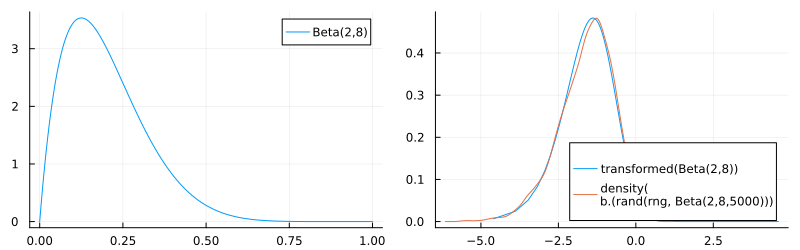

In [85]:
let
    rng = StableRNG(42)
    dist = Beta(2,8)
    
    # transformed(dist, biject(dist)) 와 동일
    
    td = transformed(dist)
    b = bijector(dist)
    b |> display
    x = 0:0.01:1
    
    b_v = b(x)   
    
    
    p1 = plot(dist, label="Beta(2,8)")
    p2 = plot(b_v,pdf.(td,b_v),label="transformed(Beta(2,8))", 
        legend=:bottomright)    
    density!(b.(rand(rng, dist,5000)), label="density(\nb.(rand(rng, Beta(2,8,5000)))")
    plot(p1,p2, layout=(1,2), size=(800,250))   
    
    
end

#### Multivariate ADVI Example

스택드 비젝터를 사용하여 다변량 ADVI를 수행할 수도 있습니다. Stacked는 단변량 및/또는 다변량 비저를 하나의 다변량 비저로 결합하는 방법을 제공합니다. 길이 2의 벡터 x가 있고 첫 번째 항목은 Exp를 사용하여 변환하고 두 번째 항목은 Log를 사용하여 변환하고 싶다고 가정해 보겠습니다. 스택은 이러한 비젝터를 쉽고 효율적으로 표현할 수 있는 방법을 제공합니다.

[Univariate ADVI example](https://turinglang.org/Bijectors.jl/dev/examples/)

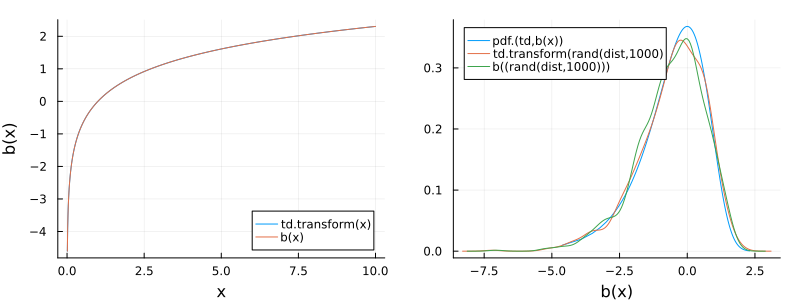

In [161]:
let
    dist= Exponential()
    plot(dist)
    x = 0:0.01:10   
    b = bijector(dist)
    td = transformed(dist,b )
    
    # td.transform(x) == b(x)
    p1 = plot(x,td.transform(x),label="td.transform(x)", xlabel="x",ylabel="b(x)")
    plot!(x,b(x), label="b(x)", xlabel="x")
    
    td_samples = td.transform(rand(dist,1000))
    td_samples2 = b((rand(dist,1000)))
    p2 = plot(b(x),pdf.(td,b(x)), legend=:topleft, label="pdf.(td,b(x))")
    density!(td_samples, xlabel="b(x)", label="td.transform(rand(dist,1000)")
    density!(td_samples2, label="b((rand(dist,1000)))")
    
    plot(p1,p2, layout=(1,2), size=(800,300), margin=3mm)
    
end

ranges = Any[1:1, 2:2, 3:4, 5:5]
numparams = 5


DiagNormal(
dim: 5
μ: [0.0, 0.0, 0.0, 0.0, 0.0]
Σ: [1.0 0.0 … 0.0 0.0; 0.0 1.0 … 0.0 0.0; … ; 0.0 0.0 … 1.0 0.0; 0.0 0.0 … 0.0 1.0]
)


bs = (Bijectors.Logit{Float64}(0.0, 1.0), Base.Fix1{typeof(broadcast), typeof(log)}(broadcast, log), SimplexBijector(), Base.Fix1{typeof(broadcast), typeof(log)}(broadcast, log))


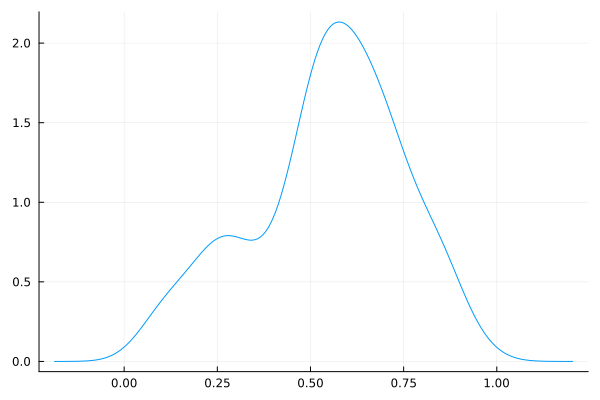

6×100 Matrix{Float64}:
 0.495251  0.753857  0.498184  0.468201  …  0.689949  0.65987   0.722181
 4.04453   0.629495  0.6164    1.92518      0.372767  1.62206   0.942175
 0.22771   0.222574  0.234     0.427797     0.561194  0.320755  0.395912
 0.359449  0.67241   0.138796  0.174271     0.325524  0.212362  0.106587
 0.412841  0.105016  0.627204  0.397932     0.113282  0.466883  0.497501
 0.85748   0.997893  0.553583  1.00477   …  0.305962  0.799307  1.19399

In [122]:
let
    using Bijectors: SimplexBijector

    function count_parameters(dist::Distribution)
        lst = collect(Base.Iterators.flatten([params(dist)...]))
        return length(lst)  # 파라미터의 수를 반환
    end
    function count_parameters2(dist::Distribution)
        return length(rand(dist))  # 파라미터의 수를 반환
    end    
    
    
    dists = (Beta(), InverseGamma(), Dirichlet(2,3),Exponential())
    ranges = []
    idx = 1
    for i in 1:length(dists)
        d = dists[i]
        param_cnt = length(d) #count_parameters2(d)
        push!(ranges, idx:(idx +  param_cnt - 1))
        idx += param_cnt
    end
    @show ranges
    numparams = ranges[end][end]
    @show numparams
#     d = filldist(Normal(0,1),numparams)
    d = MvNormal(zeros(numparams),I*ones(numparams ))
    display(d)
    bs = bijector.(dists)
    @show bs
    ibs = inverse.(bs)
    sb = Stacked(ibs, ranges)
    td = transformed(d, sb)   
    
    y = rand(td, 100)    
    density(y[1,:], legend=false) |> display
    y
    
end

In [121]:
let
    rand(Dirichlet([10,10,10]))
end

3-element Vector{Float64}:
 0.317301072343667
 0.3397411626492949
 0.34295776500703806

In [114]:
?Dirichlet

search: Dirichlet DirichletMultinomial



```
Dirichlet
```

The [Dirichlet distribution](http://en.wikipedia.org/wiki/Dirichlet_distribution) is often used as the conjugate prior for Categorical or Multinomial distributions. The probability density function of a Dirichlet distribution with parameter $\alpha = (\alpha_1, \ldots, \alpha_k)$ is:

$$
f(x; \alpha) = \frac{1}{B(\alpha)} \prod_{i=1}^k x_i^{\alpha_i - 1}, \quad \text{ with }
B(\alpha) = \frac{\prod_{i=1}^k \Gamma(\alpha_i)}{\Gamma \left( \sum_{i=1}^k \alpha_i \right)},
\quad x_1 + \cdots + x_k = 1
$$

```julia
# Let alpha be a vector
Dirichlet(alpha)         # Dirichlet distribution with parameter vector alpha

# Let a be a positive scalar
Dirichlet(k, a)          # Dirichlet distribution with parameter a * ones(k)
```


In [96]:
?Stacked

search: Stacked setadbackend AbstractBackend StackOverflowError StackTraces



```
Stacked(bs)
Stacked(bs, ranges)
stack(bs::Bijector...)
```

A `Bijector` which stacks bijectors together which can then be applied to a vector where `bs[i]::Bijector` is applied to `x[ranges[i]]::UnitRange{Int}`.

# Arguments

  * `bs` can be either a `Tuple` or an `AbstractArray` of 0- and/or 1-dimensional bijectors

      * If `bs` is a `Tuple`, implementations are type-stable using generated functions
      * If `bs` is an `AbstractArray`, implementations are *not* type-stable and use iterative methods
  * `ranges` needs to be an iterable consisting of `UnitRange{Int}`

      * `length(bs) == length(ranges)` needs to be true.

# Examples

```
b1 = Logit(0.0, 1.0)
b2 = identity
b = stack(b1, b2)
b([0.0, 1.0]) == [b1(0.0), 1.0]  # => true
```


In [89]:
Dirichlet(2,10))

LoadError: syntax: extra token ")" after end of expression

In [90]:
collect(Fill(2,3))

3-element Vector{Int64}:
 2
 2
 2

In [91]:
let
#     using Base.Iterators: flatten
# Dirichlet
    function count_parameters(dist::Distribution)
        lst = collect(Base.Iterators.flatten([params(dist)...]))
        return length(lst)  # 파라미터의 수를 반환
    end

    # 예시
    normal_dist = Dirichlet(10, 2)
    num_params = count_parameters(normal_dist)

    println(num_params)  # 출력: 2    
end

10


In [92]:
let
    dist = Dirichlet(2,3)
    params(dist) |> display
    collect(Base.Iterators.flatten([params(dist)...]))
end

(Fill(3, 2),)

2-element Vector{Int64}:
 3
 3